In [1]:
%load_ext autoreload
%autoreload 2

from micron2.data import load_as_anndata
from micron2.clustering import cluster_leiden, run_tsne, plot_embedding, cluster_leiden_cu

import scanpy as sc
import scrna

import h5py
import numpy as np
from MulticoreTSNE import MulticoreTSNE
from matplotlib import rcParams

In [2]:
sc.pp.neighbors

<function scanpy.neighbors.neighbors(adata: anndata._core.anndata.AnnData, n_neighbors: int = 15, n_pcs: Union[int, NoneType] = None, use_rep: Union[str, NoneType] = None, knn: bool = True, random_state: Union[NoneType, int, numpy.random.mtrand.RandomState] = 0, method: Union[Literal['umap', 'gauss', 'rapids'], NoneType] = 'umap', metric: Union[Literal['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan'], Literal['braycurtis', 'canberra', 'chebyshev', 'correlation', 'dice', 'hamming', 'jaccard', 'kulsinski', 'mahalanobis', 'minkowski', 'rogerstanimoto', 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean', 'yule'], Callable[[numpy.ndarray, numpy.ndarray], float]] = 'euclidean', metric_kwds: Mapping[str, Any] = mappingproxy({}), key_added: Union[str, NoneType] = None, copy: bool = False) -> Union[anndata._core.anndata.AnnData, NoneType]>

In [3]:
adata = load_as_anndata("/dev/shm/dataset.hdf5")

In [4]:
sc.pp.log1p(adata)

In [18]:
groups = cluster_leiden_cu(adata.X)
print(groups.shape)
# adata.obs['mean_leiden'] = [f'{g:02d}' for g in groups]
adata.obs['mean_leiden'] = groups
adata.obs['mean_leiden'].value_counts()

(146791,)


02    16655
07    16119
17    16072
03    14858
04    13738
01    10923
14    10334
08     8320
12     7471
05     7280
18     5932
15     5024
13     4285
10     3519
09     2286
11     1508
00     1194
16      936
06      337
Name: mean_leiden, dtype: int64

... storing 'mean_leiden' as categorical


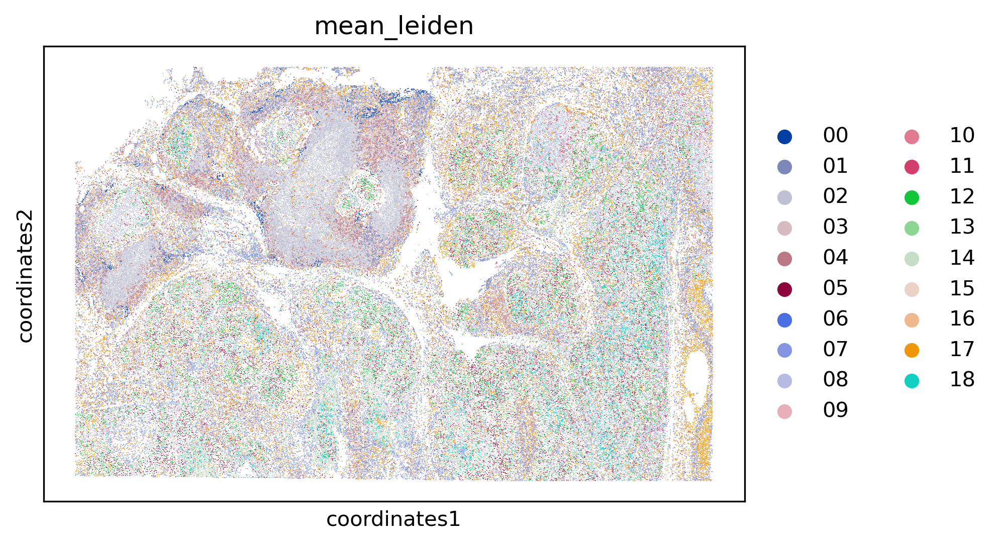

In [19]:
rcParams['figure.dpi'] = 300
sc.pl.embedding(adata, basis='coordinates', color='mean_leiden')

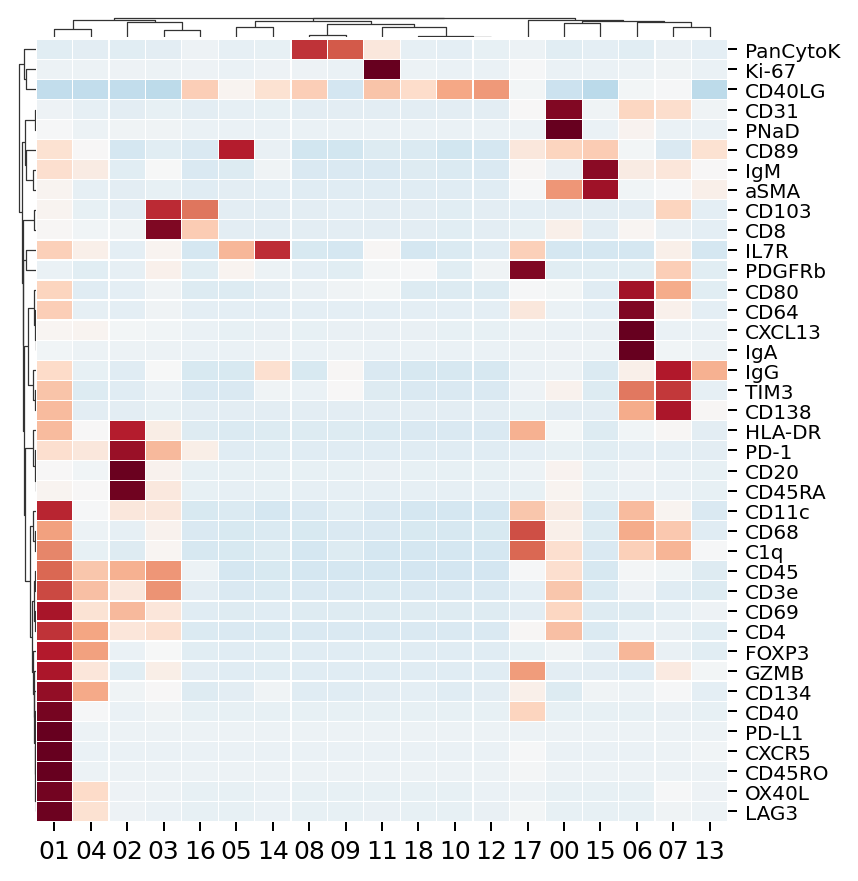

In [27]:
scrna.plot_heatmap(adata, adata.var_names[adata.var_names!='DAPI'], groupby='mean_leiden', 
                   z_score=0, cmap='RdBu_r', center_cmap=0, figsize=(5,5))

In [11]:
scrna.plot_split

<function scrna.plotting_utils.plot_split(adata, key, contrast_key=None, contrast_red_value=None, contrast_blue_value=None, ncols=4, gridsize=30, emb='X_umap', min_cells=1000, n_background=10000, percent=False, dpi=90, mincnt=1, preserve_aspect=False, rasterized=False, savefig=None)>

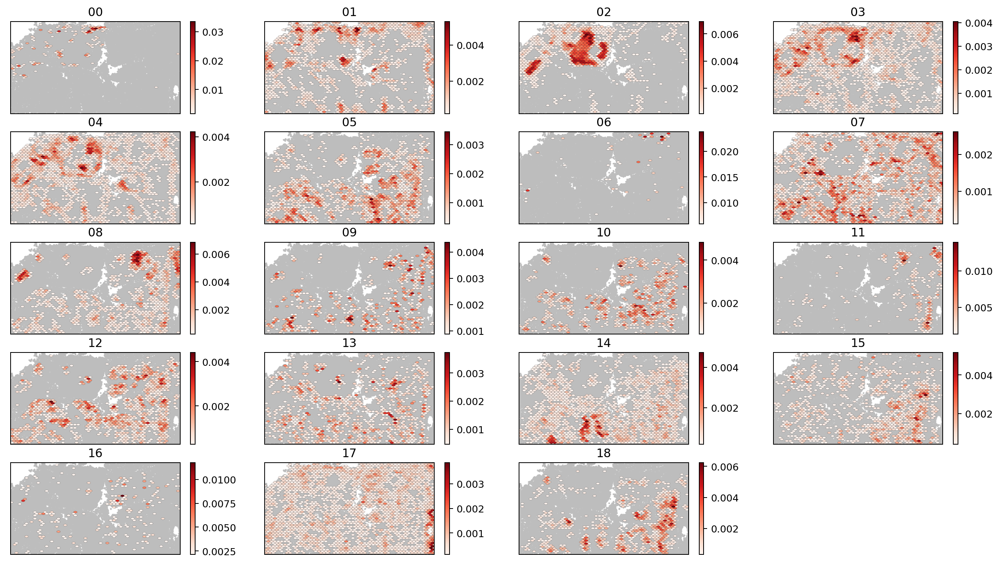

In [28]:
rcParams['figure.dpi'] = 100
scrna.plot_split(adata, key='mean_leiden', emb='coordinates', gridsize=50, percent=True, min_cells=0, 
                 dpi=180, n_background=50000,
                 preserve_aspect=True)

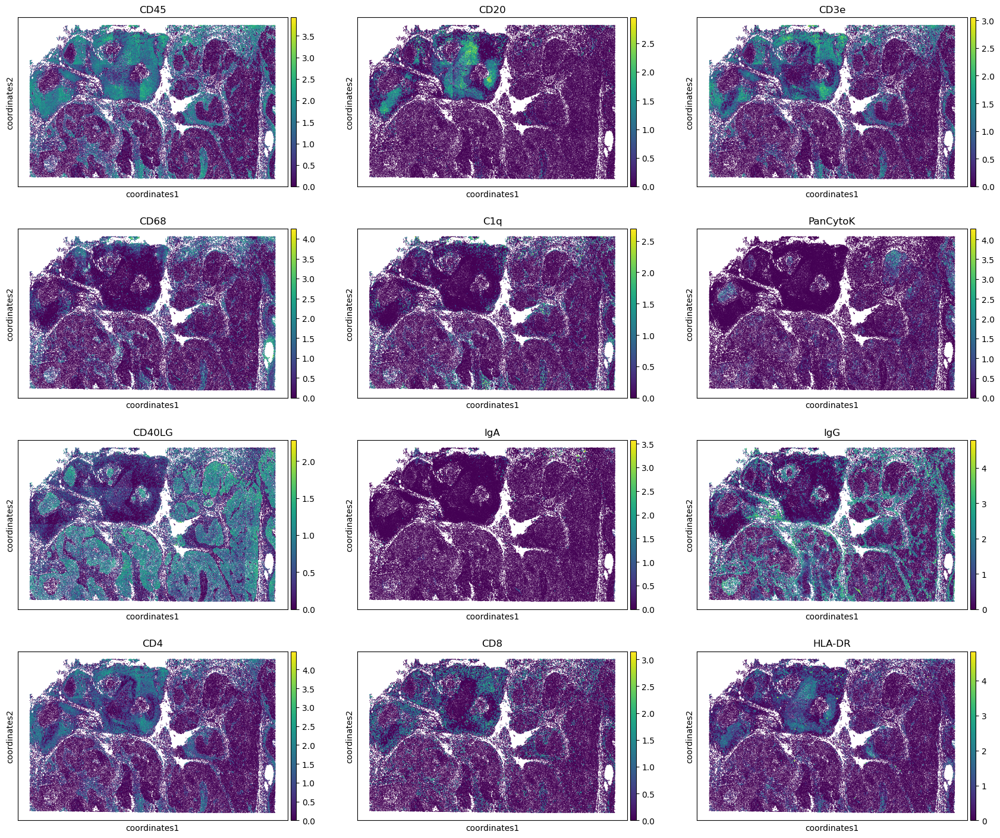

In [13]:
rcParams['figure.dpi'] = 100
sc.pl.embedding(adata, 
                basis='coordinates', 
                color=['CD45', 'CD20', 'CD3e', 
                       'CD68', 'C1q', 'PanCytoK', 
                       'CD40LG', 'IgA', 'IgG', 
                       'CD4', 'CD8', 'HLA-DR'],
                ncols=3,
                s=3
               )

In [20]:
z = np.load("trained_simclr/z_L2.npy")
groups = cluster_leiden_cu(z, resolution=2)
# adata.obs['z_leiden'] = [f'{g:02d}' for g in groups]
adata.obs['z_leiden'] = groups
print(z.shape, groups.shape)

(146791, 256) (146791,)


... storing 'z_leiden' as categorical


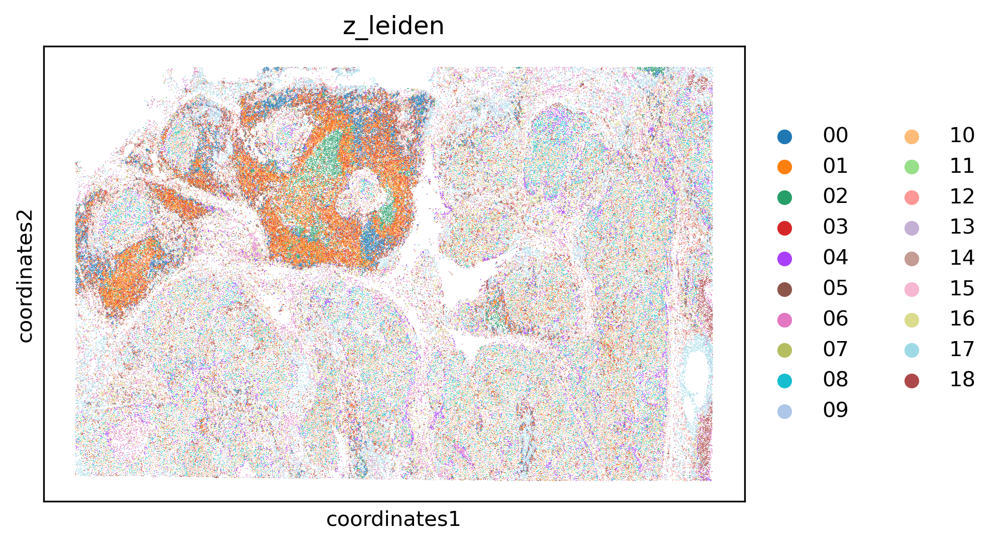

In [21]:
rcParams['figure.dpi'] = 300
sc.pl.embedding(adata, basis='coordinates', color='z_leiden')

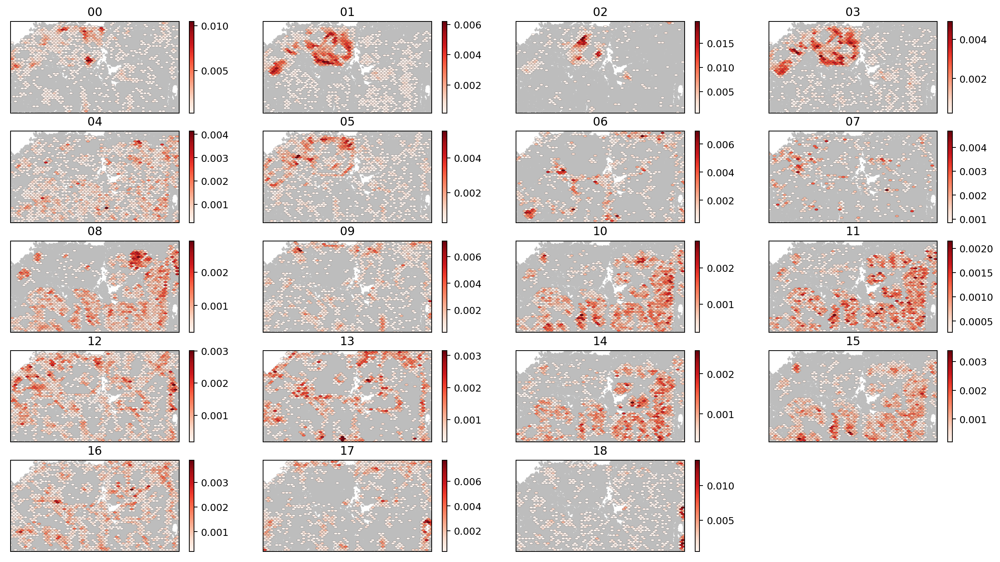

In [29]:
rcParams['figure.dpi'] = 100
scrna.plot_split(adata, key='z_leiden', emb='coordinates', gridsize=50, percent=True, min_cells=0, 
                 dpi=180, n_background=50000,
                 preserve_aspect=True)

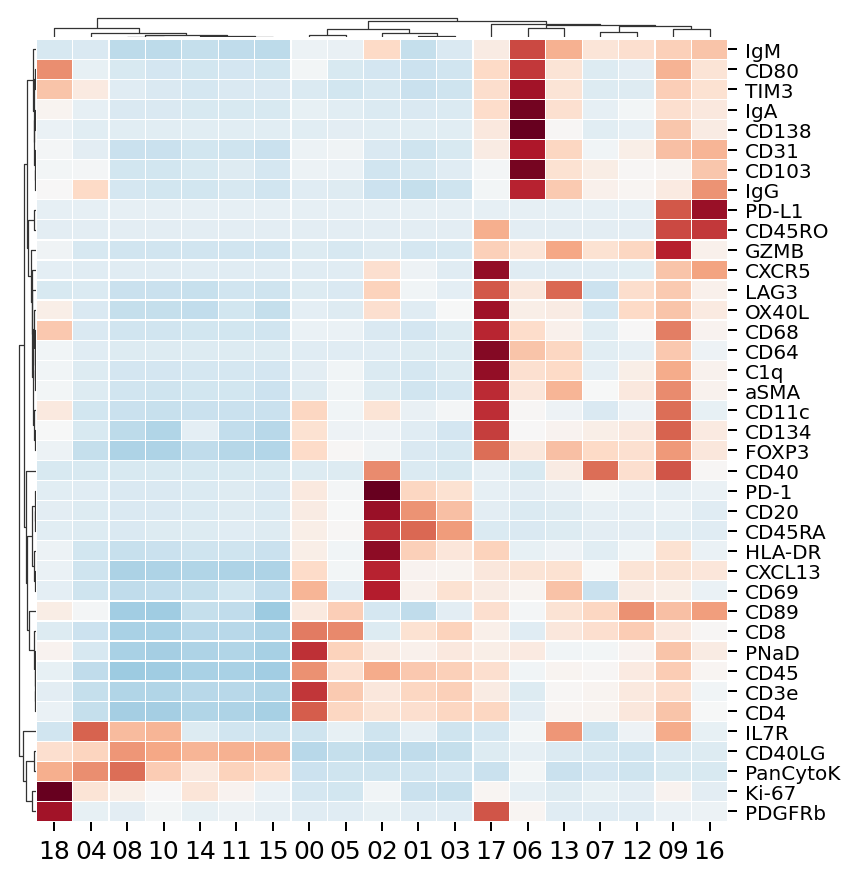

In [22]:
scrna.plot_heatmap(adata, adata.var_names[adata.var_names!='DAPI'], groupby='z_leiden', 
                   z_score=0, cmap='RdBu_r', center_cmap=0, figsize=(5,5))

In [30]:
adata

AnnData object with n_obs × n_vars = 146791 × 40
    obs: 'mean_leiden', 'z_leiden'
    uns: 'source_data', 'log1p', 'mean_leiden_colors', 'z_leiden_colors'
    obsm: 'coordinates'

In [36]:
!pwd

/home/ing/devel/micron2/notebooks/tests


In [32]:
!ls -lha

total 1.7G
drwxrwxr-x 4 ing ing 4.0K Nov 17 13:15 .
drwxrwxr-x 4 ing ing 4.0K Nov 16 16:32 ..
-rw-rw-r-- 1 ing ing 1.7G Nov 15 15:48 dataset.hdf5
-rw-rw-r-- 1 ing ing 109K Nov 16 14:52 f.h5ad
drwxrwxr-x 2 ing ing 4.0K Nov 16 21:14 .ipynb_checkpoints
-rw-rw-r-- 1 ing ing 6.0K Nov 17 12:09 test_clustering__encode_slide.ipynb
-rw-rw-r-- 1 ing ing  33K Nov 17 12:09 test_clustering__simCLR.ipynb
-rw-rw-r-- 1 ing ing  17M Nov 17 13:15 test_clutering__tsne_leiden.ipynb
-rw-rw-r-- 1 ing ing  45K Nov 16 15:20 test_data__pull_nuclei.ipynb
-rw-rw-r-- 1 ing ing 1.7K Nov 16 18:45 test_imports.ipynb
drwxrwxr-x 2 ing ing 4.0K Nov 16 22:32 trained_simclr


In [34]:
adata.write('dataset.h5ad')

In [35]:
!ls -lha

total 1.7G
drwxrwxr-x 4 ing ing 4.0K Nov 17 13:16 .
drwxrwxr-x 4 ing ing 4.0K Nov 16 16:32 ..
-rw-rw-r-- 1 ing ing  32M Nov 17 13:16 dataset.h5ad
-rw-rw-r-- 1 ing ing 1.7G Nov 15 15:48 dataset.hdf5
-rw-rw-r-- 1 ing ing 109K Nov 16 14:52 f.h5ad
drwxrwxr-x 2 ing ing 4.0K Nov 16 21:14 .ipynb_checkpoints
-rw-rw-r-- 1 ing ing 6.0K Nov 17 12:09 test_clustering__encode_slide.ipynb
-rw-rw-r-- 1 ing ing  33K Nov 17 12:09 test_clustering__simCLR.ipynb
-rw-rw-r-- 1 ing ing  17M Nov 17 13:15 test_clutering__tsne_leiden.ipynb
-rw-rw-r-- 1 ing ing  45K Nov 16 15:20 test_data__pull_nuclei.ipynb
-rw-rw-r-- 1 ing ing 1.7K Nov 16 18:45 test_imports.ipynb
drwxrwxr-x 2 ing ing 4.0K Nov 16 22:32 trained_simclr
